In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
plt.style.use('fivethirtyeight')

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.feature_selection import SelectFromModel

In [3]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving train.csv to train.csv
User uploaded file "train.csv" with length 17108795 bytes


In [4]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving test.csv to test.csv
User uploaded file "test.csv" with length 3979084 bytes


In [5]:
df = pd.read_csv('/content/train.csv')

In [47]:
test_df = pd.read_csv("/content/test.csv")

In [6]:
df.head()

,Timestamp,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Clearsky DHI,Clearsky DNI,Clearsky GHI,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity
0,2019-01-01 00:00:00,12.5,6.9,0.21,1005,121,1.0,0,0,0,0,0.258,1,173.92,1.4,68.82
1,2019-01-01 00:10:00,12.3,6.9,0.21,1005,122,1.0,0,0,0,0,0.258,1,171.79,1.3,69.73
2,2019-01-01 00:20:00,12.1,6.9,0.21,1005,124,1.0,0,0,0,0,0.258,1,169.59,1.3,70.65
3,2019-01-01 00:30:00,12.0,6.9,0.21,1005,125,1.0,0,0,0,0,0.258,1,167.37,1.3,71.11
4,2019-01-01 00:40:00,11.8,6.9,0.21,1005,126,1.0,0,0,0,0,0.258,1,165.13,1.3,71.91


<Axes: xlabel='Clearsky DHI', ylabel='Density'>

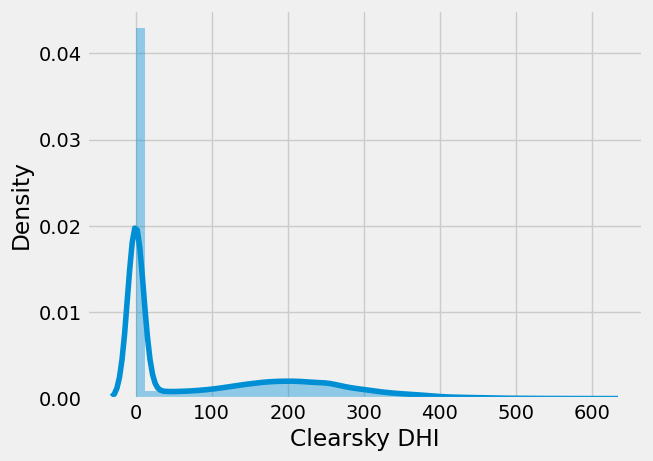

In [7]:
sns.distplot(df['Clearsky DHI'])

<Axes: xlabel='Clearsky DNI', ylabel='Density'>

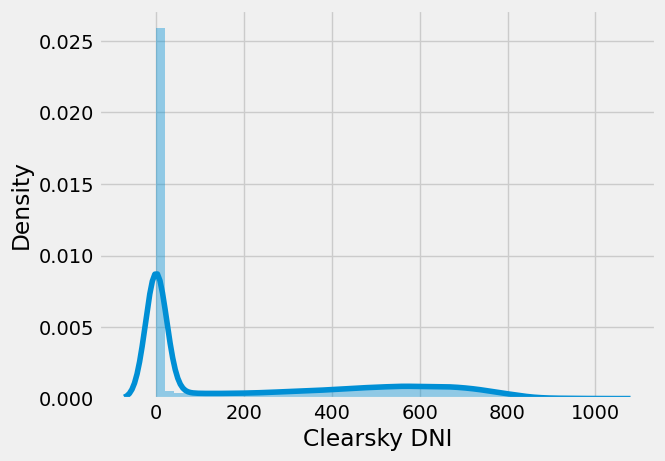

In [9]:
sns.distplot(df['Clearsky DNI'])

<Axes: xlabel='Clearsky GHI', ylabel='Density'>

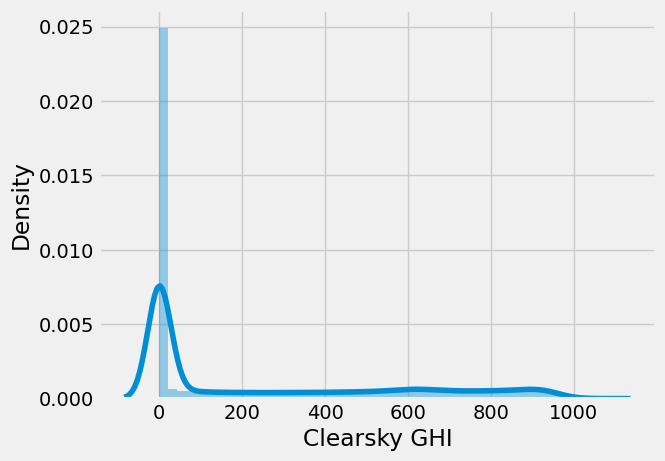

In [10]:
sns.distplot(df['Clearsky GHI'])

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210240 entries, 0 to 210239
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Timestamp           210240 non-null  object 
 1   Temperature         210240 non-null  float64
 2   Dew Point           210240 non-null  float64
 3   Surface Albedo      210240 non-null  float64
 4   Pressure            210240 non-null  int64  
 5   Wind Direction      210240 non-null  int64  
 6   Wind Speed          210240 non-null  float64
 7   Clearsky DHI        210240 non-null  int64  
 8   Clearsky DNI        210240 non-null  int64  
 9   Clearsky GHI        210240 non-null  int64  
 10  Fill Flag           210240 non-null  int64  
 11  Ozone               210240 non-null  float64
 12  Cloud Type          210240 non-null  int64  
 13  Solar Zenith Angle  210240 non-null  float64
 14  Precipitable Water  210240 non-null  float64
 15  Relative Humidity   210240 non-nul

In [12]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Timestamp,210240,210240,2019-01-01 00:00:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature,210240.0,NaN,NaN,NaN,26.795495,8.639162,1.0,20.8,27.3,32.2,48.9
Dew Point,210240.0,NaN,NaN,NaN,13.447805,10.234861,-12.4,4.9,13.1,24.4,29.1
Surface Albedo,210240.0,NaN,NaN,NaN,0.211623,0.020889,0.17,0.2,0.2,0.23,0.26
Pressure,210240.0,NaN,NaN,NaN,996.856141,7.22682,978.0,990.0,997.0,1003.0,1013.0
Wind Direction,210240.0,NaN,NaN,NaN,209.095453,101.616108,0.0,109.0,248.0,293.0,360.0
Wind Speed,210240.0,NaN,NaN,NaN,1.918037,1.194954,0.0,1.1,1.5,2.5,9.5
Clearsky DHI,210240.0,NaN,NaN,NaN,96.720681,120.33438,0.0,0.0,0.0,194.0,603.0
Clearsky DNI,210240.0,NaN,NaN,NaN,225.098992,277.920322,0.0,0.0,0.0,486.0,1008.0
Clearsky GHI,210240.0,NaN,NaN,NaN,249.938537,325.049751,0.0,0.0,0.0,533.0,1053.0


In [13]:
df.isna().sum()

Timestamp             0
Temperature           0
Dew Point             0
Surface Albedo        0
Pressure              0
Wind Direction        0
Wind Speed            0
Clearsky DHI          0
Clearsky DNI          0
Clearsky GHI          0
Fill Flag             0
Ozone                 0
Cloud Type            0
Solar Zenith Angle    0
Precipitable Water    0
Relative Humidity     0
dtype: int64

In [14]:
df.duplicated().any()

False

<h2>Numerical Features


In [15]:
df.drop('Timestamp', axis=1, inplace=True)

In [16]:
num_features=[col for col in df.columns if df[col].dtype!='O']
num_features

['Temperature',
 'Dew Point',
 'Surface Albedo',
 'Pressure',
 'Wind Direction',
 'Wind Speed',
 'Clearsky DHI',
 'Clearsky DNI',
 'Clearsky GHI',
 'Fill Flag',
 'Ozone',
 'Cloud Type',
 'Solar Zenith Angle',
 'Precipitable Water',
 'Relative Humidity']

In [17]:
num=df[num_features]
num.head()

,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Clearsky DHI,Clearsky DNI,Clearsky GHI,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity
0,12.5,6.9,0.21,1005,121,1.0,0,0,0,0,0.258,1,173.92,1.4,68.82
1,12.3,6.9,0.21,1005,122,1.0,0,0,0,0,0.258,1,171.79,1.3,69.73
2,12.1,6.9,0.21,1005,124,1.0,0,0,0,0,0.258,1,169.59,1.3,70.65
3,12.0,6.9,0.21,1005,125,1.0,0,0,0,0,0.258,1,167.37,1.3,71.11
4,11.8,6.9,0.21,1005,126,1.0,0,0,0,0,0.258,1,165.13,1.3,71.91


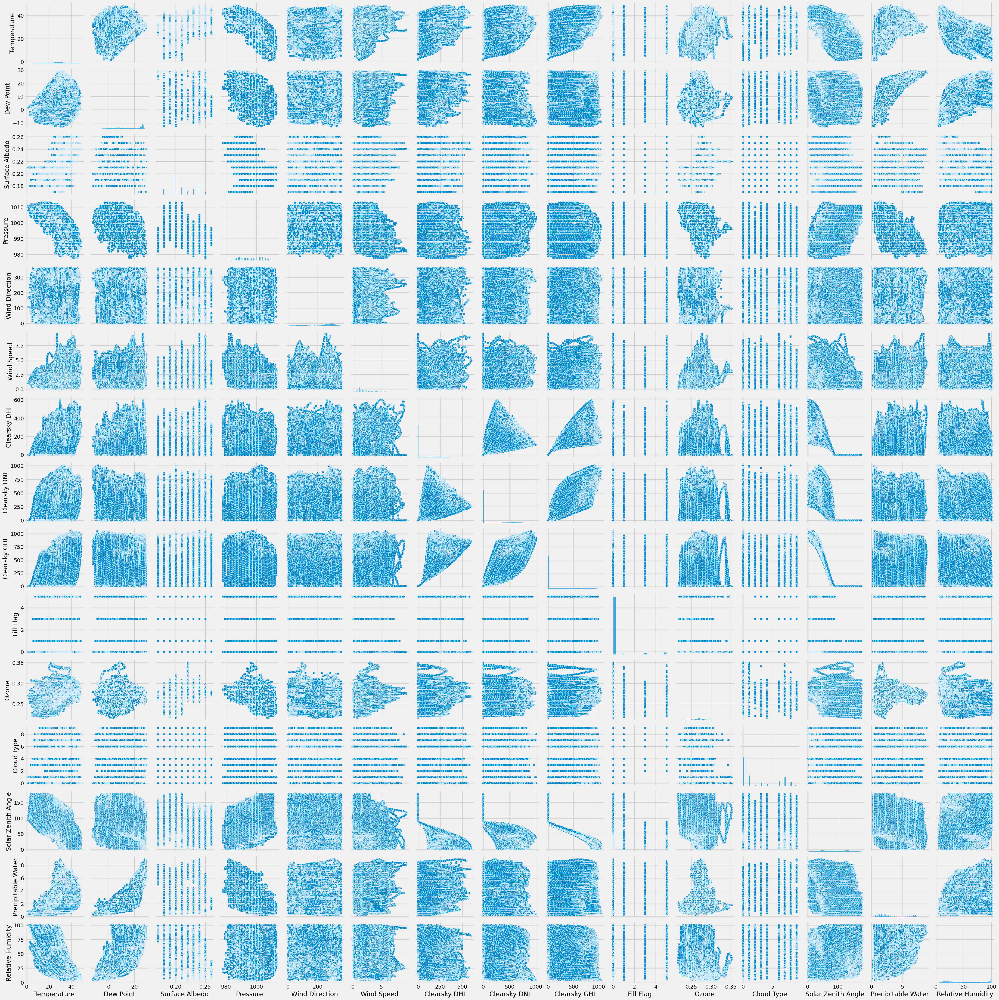

In [18]:
sns.pairplot(num)

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210240 entries, 0 to 210239
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Temperature         210240 non-null  float64
 1   Dew Point           210240 non-null  float64
 2   Surface Albedo      210240 non-null  float64
 3   Pressure            210240 non-null  int64  
 4   Wind Direction      210240 non-null  int64  
 5   Wind Speed          210240 non-null  float64
 6   Clearsky DHI        210240 non-null  int64  
 7   Clearsky DNI        210240 non-null  int64  
 8   Clearsky GHI        210240 non-null  int64  
 9   Fill Flag           210240 non-null  int64  
 10  Ozone               210240 non-null  float64
 11  Cloud Type          210240 non-null  int64  
 12  Solar Zenith Angle  210240 non-null  float64
 13  Precipitable Water  210240 non-null  float64
 14  Relative Humidity   210240 non-null  float64
dtypes: float64(8), int64(7)
memory usa

In [22]:
X = df.drop(['Clearsky DNI', 'Clearsky GHI', 'Clearsky DHI'], axis=1)
y_dni = df['Clearsky DNI']
y_ghi = df['Clearsky GHI']
y_dhi = df['Clearsky DHI']

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y_dni, test_size=0.15, random_state=101)

In [25]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [26]:
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 3.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 10.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 15.5 MB/s eta 0:00:00
 

In [27]:
from pycaret.regression import *

In [30]:
df.head()

,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Clearsky DHI,Clearsky DNI,Clearsky GHI,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity
0,12.5,6.9,0.21,1005,121,1.0,0,0,0,0,0.258,1,173.92,1.4,68.82
1,12.3,6.9,0.21,1005,122,1.0,0,0,0,0,0.258,1,171.79,1.3,69.73
2,12.1,6.9,0.21,1005,124,1.0,0,0,0,0,0.258,1,169.59,1.3,70.65
3,12.0,6.9,0.21,1005,125,1.0,0,0,0,0,0.258,1,167.37,1.3,71.11
4,11.8,6.9,0.21,1005,126,1.0,0,0,0,0,0.258,1,165.13,1.3,71.91


In [31]:
dhi_df = df.drop(['Clearsky DNI', 'Clearsky GHI'], axis=1)

In [32]:
data = dhi_df.sample(frac=0.85, random_state=101)
data_unseen = dhi_df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (178704, 13)
Unseen Data For Predictions: (31536, 13)


In [33]:
model = setup(data = data, target = 'Clearsky DHI', session_id=123)

,Description,Value
0,Session id,123
1,Target,Clearsky DHI
2,Target type,Regression
3,Original data shape,"(178704, 13)"
4,Transformed data shape,"(178704, 13)"
5,Transformed train set shape,"(125092, 13)"
6,Transformed test set shape,"(53612, 13)"
7,Numeric features,12
8,Preprocess,True
9,Imputation type,simple


In [34]:
best = compare_models(exclude = ['ransac'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,4.9318,120.4627,10.9729,0.9917,0.0849,0.0769,28.2260
rf,Random Forest Regressor,5.9272,164.3783,12.8198,0.9887,0.0893,0.0858,57.1640
xgboost,Extreme Gradient Boosting,10.0617,368.1196,19.1852,0.9747,0.5633,0.1238,14.0760
dt,Decision Tree Regressor,7.3692,382.9957,19.5637,0.9736,0.1272,0.1072,1.0550
lightgbm,Light Gradient Boosting Machine,11.5436,513.1023,22.6499,0.9647,0.2507,0.1426,1.2290
knn,K Neighbors Regressor,10.8288,534.9581,23.1273,0.9632,0.2715,0.1721,1.2050
gbr,Gradient Boosting Regressor,15.6067,906.0413,30.0983,0.9376,0.7156,0.1841,21.1900
ada,AdaBoost Regressor,20.8907,1314.9797,36.2601,0.9095,1.1350,0.2347,9.3900
lar,Least Angle Regression,45.2971,3310.5811,57.5368,0.7721,2.5366,0.8941,0.1380
br,Bayesian Ridge,45.2993,3310.5912,57.5369,0.7721,2.5368,0.8942,0.3610


Processing:   0%|          | 0/77 [00:00<?, ?it/s]

In [35]:
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4.9055,120.1338,10.9606,0.9918,0.0815,0.0757
1,4.9693,119.8277,10.9466,0.9917,0.0818,0.0747
2,4.8161,115.2840,10.7370,0.9920,0.0858,0.0793
3,4.8653,123.0257,11.0917,0.9914,0.0825,0.0771
4,5.0515,121.3835,11.0174,0.9916,0.0831,0.0745
5,4.7568,109.2453,10.4520,0.9924,0.0885,0.0756
6,4.8350,119.9310,10.9513,0.9918,0.0835,0.0777
7,5.1458,130.6085,11.4284,0.9910,0.0898,0.0806
8,5.0139,124.4069,11.1538,0.9916,0.0869,0.0780


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

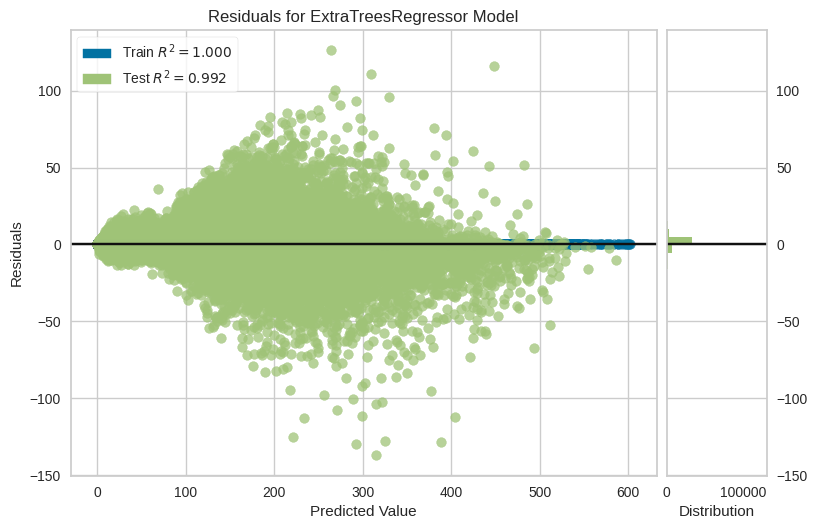

In [36]:
plot_model(et)

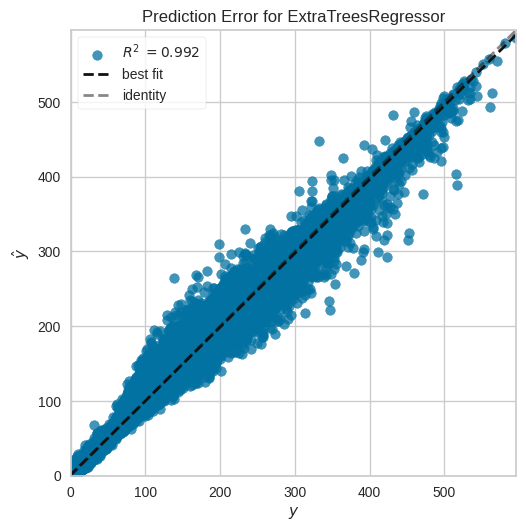

In [37]:
plot_model(et, plot = 'error')

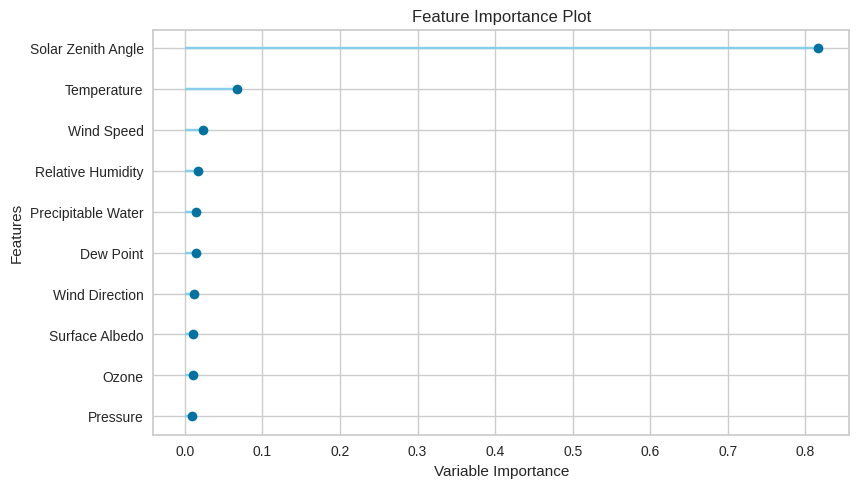

In [38]:
plot_model(et, plot='feature')

In [39]:
predict_model(et);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,4.6529,108.4704,10.4149,0.9924,0.0847,0.0750


In [40]:
final_et = finalize_model(et)

In [41]:
unseen_predictions = predict_model(et, data=data_unseen)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,4.6089,105.2161,10.2575,0.9927,0.0787,0.0729


In [42]:
unseen_predictions.head()

,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity,Clearsky DHI,prediction_label
0,12.000000,6.9,0.21,1005,125,1.0,0,0.258,1,167.369995,1.3,71.110001,0,0.00
1,11.800000,6.9,0.21,1005,126,1.0,0,0.258,1,165.130005,1.3,71.910004,0,0.00
2,8.500000,7.4,0.21,1005,165,1.1,0,0.257,1,109.440002,1.4,92.970001,0,0.00
3,14.100000,-2.7,0.20,1009,123,0.5,0,0.286,3,100.830002,0.7,31.180000,0,0.00
4,18.799999,-2.6,0.20,1011,198,1.2,5,0.291,7,67.739998,0.7,23.330000,156,134.07


In [44]:
test_df.head()

,Timestamp,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Clearsky DHI,Clearsky DNI,Clearsky GHI,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity
0,2023-01-01 00:00:00,11.3,1.6,0.21,1006,305,1.2,NaN,NaN,NaN,0,0.255,0,173.92,1.4,51.38
1,2023-01-01 00:10:00,11.2,1.6,0.21,1006,306,1.2,NaN,NaN,NaN,0,0.255,0,171.79,1.4,51.72
2,2023-01-01 00:20:00,11.1,1.6,0.21,1006,306,1.2,NaN,NaN,NaN,0,0.255,0,169.59,1.4,52.06
3,2023-01-01 00:30:00,11.0,1.6,0.21,1006,307,1.2,NaN,NaN,NaN,0,0.255,0,167.37,1.4,52.41
4,2023-01-01 00:40:00,10.9,1.2,0.21,1006,307,1.2,NaN,NaN,NaN,0,0.255,0,165.13,1.4,51.34


In [48]:
test_df.drop(['Timestamp', 'Clearsky DNI', 'Clearsky GHI', 'Clearsky DHI'], axis=1, inplace=True)

In [49]:
test_predictions = predict_model(final_et, data=test_df)
test_predictions.head()

,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity,prediction_label
0,11.3,1.6,0.21,1006,305,1.2,0,0.255,0,173.919998,1.4,51.380001,0.0
1,11.2,1.6,0.21,1006,306,1.2,0,0.255,0,171.789993,1.4,51.720001,0.0
2,11.1,1.6,0.21,1006,306,1.2,0,0.255,0,169.589996,1.4,52.060001,0.0
3,11.0,1.6,0.21,1006,307,1.2,0,0.255,0,167.369995,1.4,52.410000,0.0
4,10.9,1.2,0.21,1006,307,1.2,0,0.255,0,165.130005,1.4,51.340000,0.0


In [50]:
test_df['Clearsky DHI'] = test_predictions['prediction_label']

In [51]:
dni_df = df.drop(['Clearsky DHI', 'Clearsky GHI'], axis=1)

In [52]:
data = dni_df.sample(frac=0.85, random_state=101)
data_unseen = dni_df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (178704, 13)
Unseen Data For Predictions: (31536, 13)


In [53]:
model = setup(data = data, target = 'Clearsky DNI', session_id=123)

,Description,Value
0,Session id,123
1,Target,Clearsky DNI
2,Target type,Regression
3,Original data shape,"(178704, 13)"
4,Transformed data shape,"(178704, 13)"
5,Transformed train set shape,"(125092, 13)"
6,Transformed test set shape,"(53612, 13)"
7,Numeric features,12
8,Preprocess,True
9,Imputation type,simple


In [54]:
best = compare_models(exclude = ['ransac'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,14.5741,992.1468,31.4932,0.9872,0.2292,0.2332,29.2150
rf,Random Forest Regressor,17.3821,1307.6073,36.1576,0.9831,0.2345,0.2511,59.2700
xgboost,Extreme Gradient Boosting,25.1069,1932.9464,43.9616,0.9750,1.0707,0.2632,14.4430
knn,K Neighbors Regressor,25.8764,2592.6251,50.9139,0.9665,0.3932,0.3339,1.0210
lightgbm,Light Gradient Boosting Machine,28.2648,2623.7843,51.2211,0.9661,0.5468,0.3222,1.3080
dt,Decision Tree Regressor,21.9276,2768.9115,52.6102,0.9642,0.3082,0.2902,1.1220
gbr,Gradient Boosting Regressor,37.2283,4037.8370,63.5410,0.9479,1.2297,0.3977,21.9030
ada,AdaBoost Regressor,50.8571,5911.4565,76.8796,0.9237,1.9150,0.6820,11.1670
br,Bayesian Ridge,101.1610,15268.4658,123.5645,0.8028,3.0952,1.7886,0.1800
ridge,Ridge Regression,101.1962,15270.0812,123.5710,0.8028,3.0951,1.7935,0.2470


Processing:   0%|          | 0/77 [00:00<?, ?it/s]

In [55]:
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,14.4856,993.4809,31.5195,0.9872,0.2247,0.2456
1,14.5484,975.6095,31.2347,0.9874,0.2302,0.2320
2,14.4003,981.7739,31.3333,0.9872,0.2353,0.2495
3,14.4343,1023.1819,31.9872,0.9866,0.2287,0.2395
4,15.3040,1043.0645,32.2965,0.9867,0.2311,0.2461
5,14.1051,920.8115,30.3449,0.9882,0.2392,0.2196
6,14.4021,1003.3097,31.6751,0.9870,0.2169,0.1920
7,15.1379,1042.0853,32.2813,0.9865,0.2276,0.2375
8,14.4491,973.6337,31.2031,0.9875,0.2300,0.2434


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [56]:
final_et = finalize_model(et)

In [57]:
test_df.head()

,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity,Clearsky DHI
0,11.3,1.6,0.21,1006,305,1.2,0,0.255,0,173.92,1.4,51.38,0.0
1,11.2,1.6,0.21,1006,306,1.2,0,0.255,0,171.79,1.4,51.72,0.0
2,11.1,1.6,0.21,1006,306,1.2,0,0.255,0,169.59,1.4,52.06,0.0
3,11.0,1.6,0.21,1006,307,1.2,0,0.255,0,167.37,1.4,52.41,0.0
4,10.9,1.2,0.21,1006,307,1.2,0,0.255,0,165.13,1.4,51.34,0.0


In [58]:
test_dni = test_df.drop(['Clearsky DHI'], axis=1)

In [59]:
test_predictions = predict_model(final_et, data=test_dni)
test_predictions.head()

,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity,prediction_label
0,11.3,1.6,0.21,1006,305,1.2,0,0.255,0,173.919998,1.4,51.380001,0.0
1,11.2,1.6,0.21,1006,306,1.2,0,0.255,0,171.789993,1.4,51.720001,0.0
2,11.1,1.6,0.21,1006,306,1.2,0,0.255,0,169.589996,1.4,52.060001,0.0
3,11.0,1.6,0.21,1006,307,1.2,0,0.255,0,167.369995,1.4,52.410000,0.0
4,10.9,1.2,0.21,1006,307,1.2,0,0.255,0,165.130005,1.4,51.340000,0.0


In [60]:
test_df['Clearsky DNI'] = test_predictions['prediction_label']

In [61]:
ghi_df = df.drop(['Clearsky DHI', 'Clearsky DNI'], axis=1)

In [62]:
data = ghi_df.sample(frac=0.85, random_state=101)
data_unseen = ghi_df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (178704, 13)
Unseen Data For Predictions: (31536, 13)


In [63]:
model = setup(data = data, target = 'Clearsky GHI', session_id=123)

,Description,Value
0,Session id,123
1,Target,Clearsky GHI
2,Target type,Regression
3,Original data shape,"(178704, 13)"
4,Transformed data shape,"(178704, 13)"
5,Transformed train set shape,"(125092, 13)"
6,Transformed test set shape,"(53612, 13)"
7,Numeric features,12
8,Preprocess,True
9,Imputation type,simple


In [64]:
best = compare_models(exclude = ['ransac'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,5.3816,90.6472,9.5198,0.9991,0.4302,0.0516,14.5390
et,Extra Trees Regressor,5.4467,112.3920,10.6005,0.9989,0.0765,0.0554,30.3110
lightgbm,Light Gradient Boosting Machine,6.0653,124.5276,11.1584,0.9988,0.1801,0.0597,1.4650
rf,Random Forest Regressor,5.8394,125.9700,11.2227,0.9988,0.0757,0.0571,58.6830
gbr,Gradient Boosting Regressor,7.6094,183.2979,13.5379,0.9983,0.4444,0.0670,20.9270
knn,K Neighbors Regressor,8.2729,241.8763,15.5506,0.9977,0.2737,0.1261,1.1290
dt,Decision Tree Regressor,8.2376,265.8290,16.3028,0.9975,0.1044,0.0771,1.0990
ada,AdaBoost Regressor,27.8789,954.5494,30.8840,0.9910,2.5311,0.2492,11.4670
br,Bayesian Ridge,112.2524,18142.4261,134.6929,0.8289,3.2119,1.7166,0.2390
ridge,Ridge Regression,112.2776,18143.2102,134.6958,0.8289,3.2124,1.7186,0.2730


Processing:   0%|          | 0/77 [00:00<?, ?it/s]

In [72]:
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,5.3721,109.2049,10.4501,0.9990,0.0719,0.0539
1,5.4144,109.8767,10.4822,0.9990,0.0750,0.0534
2,5.3491,112.7359,10.6177,0.9989,0.0791,0.0580
3,5.4172,114.0191,10.6780,0.9989,0.0728,0.0557
4,5.6517,116.4968,10.7934,0.9989,0.0749,0.0529
5,5.3446,107.9054,10.3878,0.9990,0.0816,0.0558
6,5.3944,111.2001,10.5451,0.9990,0.0759,0.0559
7,5.5813,115.4122,10.7430,0.9989,0.0804,0.0582
8,5.5008,116.9277,10.8133,0.9989,0.0782,0.0563


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [73]:
final_et = finalize_model(et)

In [74]:
test_df.head()

,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity,Clearsky DHI,Clearsky DNI,Clearsky GHI
0,11.3,1.6,0.21,1006,305,1.2,0,0.255,0,173.92,1.4,51.38,0.0,0.0,-0.448263
1,11.2,1.6,0.21,1006,306,1.2,0,0.255,0,171.79,1.4,51.72,0.0,0.0,-0.448263
2,11.1,1.6,0.21,1006,306,1.2,0,0.255,0,169.59,1.4,52.06,0.0,0.0,-0.448263
3,11.0,1.6,0.21,1006,307,1.2,0,0.255,0,167.37,1.4,52.41,0.0,0.0,-0.448263
4,10.9,1.2,0.21,1006,307,1.2,0,0.255,0,165.13,1.4,51.34,0.0,0.0,-0.448263


In [75]:
test_ghi = test_df.drop(['Clearsky DHI', 'Clearsky DNI'], axis=1)

In [78]:
test_predictions = predict_model(final_et, data=test_ghi)
test_predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,4.2113,52.0088,7.2117,0.9995,0.5198,0.5924


,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Fill Flag,Ozone,Cloud Type,Solar Zenith Angle,Precipitable Water,Relative Humidity,Clearsky GHI,prediction_label
0,11.3,1.6,0.21,1006,305,1.2,0,0.255,0,173.919998,1.4,51.380001,-0.448263,0.0
1,11.2,1.6,0.21,1006,306,1.2,0,0.255,0,171.789993,1.4,51.720001,-0.448263,0.0
2,11.1,1.6,0.21,1006,306,1.2,0,0.255,0,169.589996,1.4,52.060001,-0.448263,0.0
3,11.0,1.6,0.21,1006,307,1.2,0,0.255,0,167.369995,1.4,52.410000,-0.448263,0.0
4,10.9,1.2,0.21,1006,307,1.2,0,0.255,0,165.130005,1.4,51.340000,-0.448263,0.0


In [79]:
test_df['Clearsky GHI'] = test_predictions['prediction_label']

In [82]:
test_df[['Clearsky DHI', 'Clearsky DNI', 'Clearsky GHI']].to_csv('submission.csv', index=False)